<a href="https://colab.research.google.com/github/devjaind123/Tuberculosis-detection-using-Deep-learning/blob/main/Tuberculosis_Detection_Minor_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install scikit-plot

In [39]:
# import all libraries
# Train/Test Libraries
import os
import numpy as np
import tensorflow as tf
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import scikitplot
from sklearn.metrics import roc_curve, auc
from keras.preprocessing.image import load_img, img_to_array
from tqdm.notebook import tqdm

In [10]:
dataDir = '/content/drive/MyDrive/TB Dataset'
directories = os.listdir(dataDir)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Preprocessing

In [12]:
def Read_Images_and_Make_Numpy_Files(directory):
  images = []
  labels = []
  classes = os.listdir(os.path.join(dataDir, directory))
  print('{} Directory Classes: {}'.format(directory, classes))
  for class_ in classes:
    if class_ == '0':
      print('Reading Data for {} class'.format(class_))
      imageNames = os.listdir(os.path.join(dataDir, directory, class_))
      for imgName in tqdm(imageNames):
        img = load_img(os.path.join(dataDir, directory, class_, imgName), target_size=(224, 224), color_mode='rgb', interpolation='lanczos')
        img_array = img_to_array(img, data_format='channels_last', dtype='float32')
        images.append(img_array)
        labels.append(0)
    elif class_ == '1':
      print('Reading Data for {} class'.format(class_))
      imageNames = os.listdir(os.path.join(dataDir, directory, class_))
      for imgName in tqdm(imageNames):
        img = load_img(os.path.join(dataDir, directory, class_, imgName), target_size=(224, 224), color_mode='rgb', interpolation='lanczos')
        img_array = img_to_array(img, data_format='channels_last', dtype='float32')
        images.append(img_array)
        labels.append(1)
    
  
  images = np.array(images).reshape(-1, 224, 224, 3)
  print('{} Data: {}'.format(directory, images.shape))
  labels = np.array(labels)
  print('{} Labels: {}'.format(directory, labels.shape))
  np.save('/content/drive/MyDrive/Numpy Files/{}_images'.format(directory), images)
  np.save('/content/drive/MyDrive/Numpy Files/{}_labels'.format(directory), labels)


for directory in directories:
    if directory=='train':
      Read_Images_and_Make_Numpy_Files(directory)
    elif directory=='valid':
      Read_Images_and_Make_Numpy_Files(directory)

valid Directory Classes: ['1', '0']
Reading Data for 1 class


  0%|          | 0/97 [00:00<?, ?it/s]

Reading Data for 0 class


  0%|          | 0/98 [00:00<?, ?it/s]

valid Data: (195, 224, 224, 3)
valid Labels: (195,)
train Directory Classes: ['0', '1']
Reading Data for 0 class


  0%|          | 0/106 [00:00<?, ?it/s]

Reading Data for 1 class


  0%|          | 0/96 [00:00<?, ?it/s]

train Data: (202, 224, 224, 3)
train Labels: (202,)


In [13]:
IMG_SIZE = 224

train_x = np.load('/content/drive/MyDrive/Numpy Files/train_images.npy')
train_y = np.load('/content/drive/MyDrive/Numpy Files/train_labels.npy')
test_x = np.load('/content/drive/MyDrive/Numpy Files/valid_images.npy')
test_y = np.load('/content/drive/MyDrive/Numpy Files/valid_labels.npy')

print('Training Images: {} | Test Images: {}'.format(train_x.shape, test_x.shape))
print('Training Labels: {} | Test Labels: {}'.format(train_y.shape, test_y.shape))

# Data Normalization

print('Train: {} , {} | Test: {} , {}'.format(train_x.min(), train_x.max(), test_x.min(), test_x.max()))

train_x/=255.0
test_x/=255.0

print('Train: {} , {} | Test: {} , {}'.format(train_x.min(), train_x.max(), test_x.min(), test_x.max()))

Training Images: (202, 224, 224, 3) | Test Images: (195, 224, 224, 3)
Training Labels: (202,) | Test Labels: (195,)
Train: 0.0 , 255.0 | Test: 0.0 , 255.0
Train: 0.0 , 1.0 | Test: 0.0 , 1.0


In [14]:
# Class Mapping 
print('0:Healthy | 1:Tuberculosis')

# Distribution of images in each class for Training-set
print(Counter(train_y))

# Distribution of images in each class for Test-set
print(Counter(test_y))

# Make Labels Categorical
train_y_oneHot = tf.one_hot(train_y, depth=2) 
test_y_oneHot = tf.one_hot(test_y, depth=2)

print('Training Labels: {} | Test Labels: {}'.format(train_y_oneHot.shape, test_y_oneHot.shape))

0:Healthy | 1:Tuberculosis
Counter({0: 106, 1: 96})
Counter({0: 98, 1: 97})
Training Labels: (202, 2) | Test Labels: (195, 2)


In [15]:
# initialize the training data augmentation object
trainAug = tf.keras.preprocessing.image.ImageDataGenerator(height_shift_range = 0.15,
                                                          width_shift_range = 0.15,
                                                          rotation_range = 10,
                                                          shear_range = 0.1,
                                                          fill_mode = 'nearest',
                                                          zoom_range=0.2
                                                          )

# CNN Model

In [16]:
def TuberculosisModel():
  inputs= tf.keras.layers.Input(shape=(224, 224, 3))
  
  outputs = tf.keras.layers.Conv2D(32, (3, 3), padding='same')(inputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)
  outputs = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(outputs)

  outputs = tf.keras.layers.Conv2D(32, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)
  outputs = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(outputs)

  outputs = tf.keras.layers.Conv2D(64, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)
  outputs = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(outputs)

  outputs = tf.keras.layers.Conv2D(128, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)

  outputs = tf.keras.layers.Conv2D(256, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)

  outputs = tf.keras.layers.Conv2D(128, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)
  outputs = tf.keras.layers.AveragePooling2D(pool_size=(2, 2))(outputs)

  outputs = tf.keras.layers.Conv2D(64, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)
  outputs = tf.keras.layers.AveragePooling2D(pool_size=(2, 2))(outputs)

  outputs = tf.keras.layers.Conv2D(32, (3, 3))(outputs)
  outputs = tf.keras.layers.Activation("relu")(outputs)
  outputs = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(outputs)

  outputs = tf.keras.layers.Flatten()(outputs)
  outputs = tf.keras.layers.Dense(32)(outputs)
  outputs = tf.keras.layers.Dropout(0.25)(outputs)
  outputs = tf.keras.layers.Dense(2)(outputs)
  outputs = tf.keras.layers.Activation("softmax")(outputs)

  model = tf.keras.Model(inputs=inputs, outputs=outputs)
  return model

model = TuberculosisModel()
# compile our model
print("[INFO] compiling model...")
# initialize the initial learning rate, number of epochs to train for, and batch size
INIT_LR = 0.001
EPOCHS = 100
BATCHSIZE = 32 
optimizer = tf.keras.optimizers.Adam(lr=INIT_LR)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=['categorical_accuracy'])
print(model.summary())

[INFO] compiling model...
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 activation (Activation)     (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 32)      9248      
                                                                 
 activation_1 (Activation)   (None, 110, 110, 32)      0         
                                   

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [19]:
modelPath = './saved Models/Classification/Simple CNN'
if not os.path.exists(modelPath):
  os.makedirs(modelPath)
  print('Model Directory Created')
else:
  print('Model Directory Already Exists')

reduceLROnPlat = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_categorical_accuracy', factor=0.8, patience=10, verbose=1, mode='auto',
                                                      min_delta=0.0001, cooldown=5, min_lr=0.0001)
early = tf.keras.callbacks.EarlyStopping(monitor="val_categorical_accuracy", mode="auto", patience=10)
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(modelPath+'/cnn-tb-best-model.h5', monitor='val_categorical_accuracy',
                                                      verbose=1, save_best_only=True, mode='auto')
STEP_TRAIN = len(train_x) // BATCHSIZE

modelHistory = model.fit(trainAug.flow(train_x, train_y_oneHot, batch_size=BATCHSIZE), steps_per_epoch=STEP_TRAIN, 
                         validation_data= (test_x, test_y_oneHot), epochs=EPOCHS, verbose=1, callbacks=[model_checkpoint])

tf.keras.models.save_model(model, modelPath+'/cnn-tb-model.h5', overwrite=True, include_optimizer=True, save_format=None,
                           signatures=None, options=None)

Model Directory Created
Epoch 1/100
6/6 [==============================] - ETA: 0s - loss: 0.6996 - categorical_accuracy: 0.4740
Epoch 1: val_categorical_accuracy improved from -inf to 0.50256, saving model to ./saved Models/Classification/Simple CNN/cnn-tb-best-model.h5
6/6 [==============================] - 21s 3s/step - loss: 0.6996 - categorical_accuracy: 0.4740 - val_loss: 0.6933 - val_categorical_accuracy: 0.5026
Epoch 2/100
6/6 [==============================] - ETA: 0s - loss: 0.6990 - categorical_accuracy: 0.4588
Epoch 2: val_categorical_accuracy did not improve from 0.50256
6/6 [==============================] - 16s 3s/step - loss: 0.6990 - categorical_accuracy: 0.4588 - val_loss: 0.6930 - val_categorical_accuracy: 0.5026
Epoch 3/100
6/6 [==============================] - ETA: 0s - loss: 0.6924 - categorical_accuracy: 0.5353
Epoch 3: val_categorical_accuracy did not improve from 0.50256
6/6 [==============================] - 16s 3s/step - loss: 0.6924 - categorical_accuracy: 

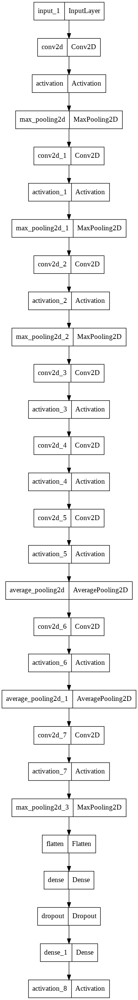

In [29]:
from keras.utils.vis_utils import plot_model
plot_model(model)

In [20]:
# Evaluate the Best Saved Model
bestModel = tf.keras.models.load_model('/content/saved Models/Classification/Simple CNN/cnn-tb-best-model.h5')
loss, accuracy= model.evaluate(x=test_x, y=test_y_oneHot, batch_size=32, verbose=1)
print('Model Accuracy: {:0.2f} | Model Loss: {:0.4f}'.format(accuracy, loss))

7/7 [==============================] - 4s 518ms/step - loss: 0.6429 - categorical_accuracy: 0.6667
Model Accuracy: 0.67 | Model Loss: 0.6429


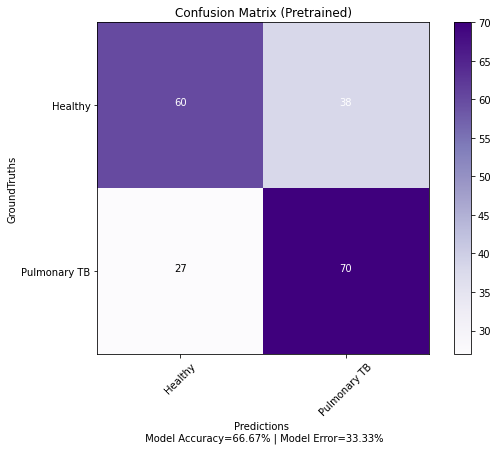

In [22]:
def plot_confusion_matrix(cm, target_names, title='Confusion matrix', cmap=None, normalize=True):

    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Purples')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('GroundTruths')
    plt.xlabel('Predictions \n Model Accuracy={:0.2f}% | Model Error={:0.2f}%'.format(accuracy*100, misclass*100))
    plt.savefig('/content/drive/MyDrive/TB Images/VGG16-cm.png', bbox_inches = "tight")
    plt.show()


predictions = model.predict(x=test_x, batch_size=32)
predictions = tf.keras.backend.argmax(predictions, axis=-1)

test_y = tf.keras.backend.argmax(test_y_oneHot, axis=-1)
cm = confusion_matrix(test_y, predictions)
classes = ['Healthy', 'Pulmonary TB']
plot_confusion_matrix(cm=cm, normalize = False, target_names = classes, title= "Confusion Matrix (Pretrained)")

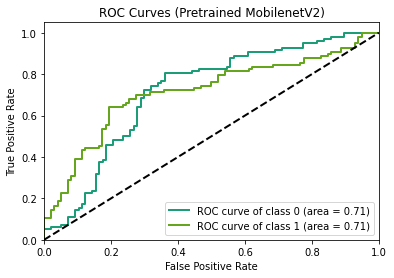

In [31]:
#Plot ROC Curve with Library
predictions = model.predict(x=test_x, batch_size=32)
# One can define colormap here
# cmap = mpl.colors.ListedColormap(['red', 'green', 'blue', 'cyan'])
scikitplot.metrics.plot_roc(y_true=test_y, y_probas=predictions, title='ROC Curves (Pretrained MobilenetV2)', plot_micro=False, plot_macro=False,
                            classes_to_plot=None, ax=None, figsize=(6, 4), cmap='Dark2', title_fontsize='large', text_fontsize='medium')
plt.savefig('/content/drive/MyDrive/TB Images/CNN-roc.png', bbox_inches = "tight")
plt.show()

In [41]:
!pip install tf.keras.vis

     |████████████████████████████████| 53 kB 1.3 MB/s 


In [42]:
# Visualization Libraries
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils import normalize
from matplotlib import cm

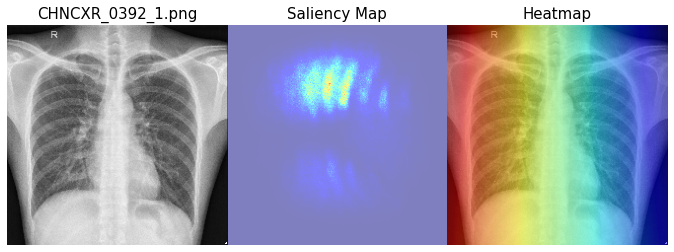

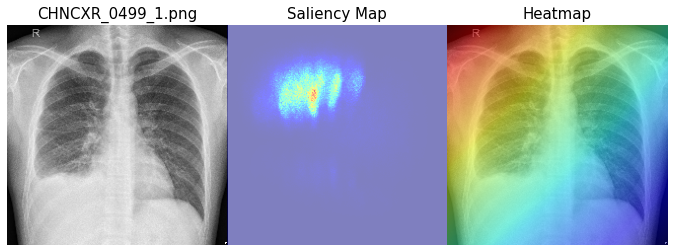

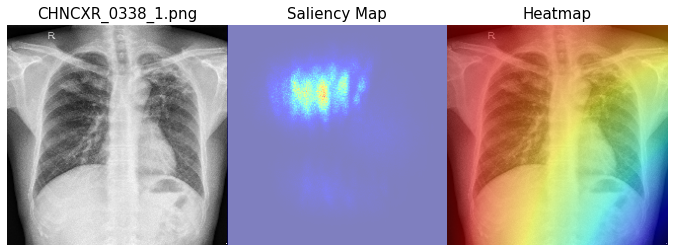

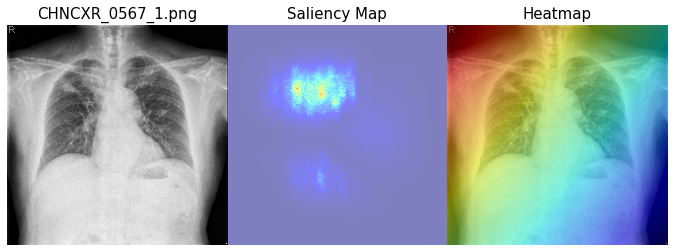

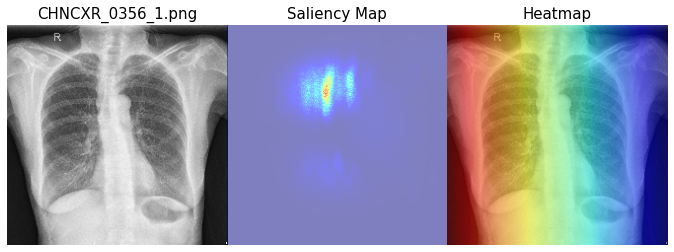

...

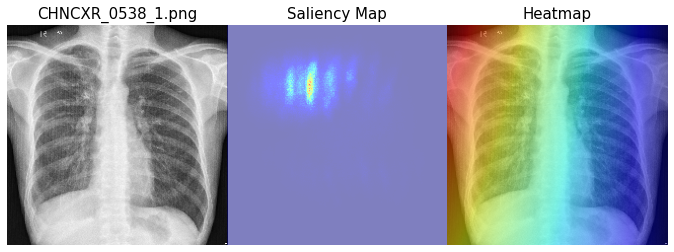

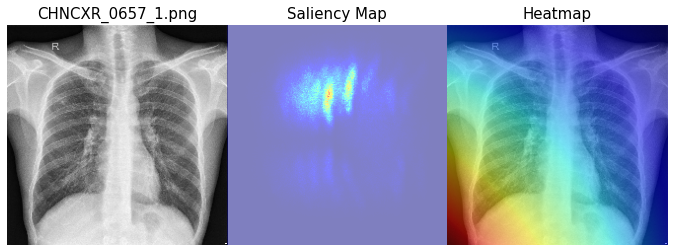

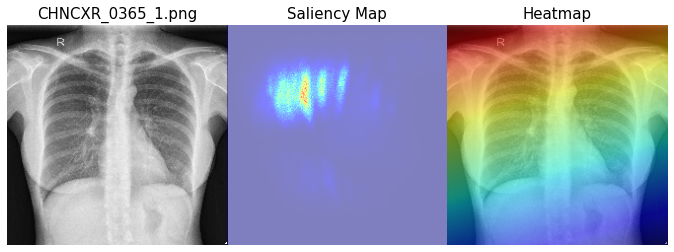

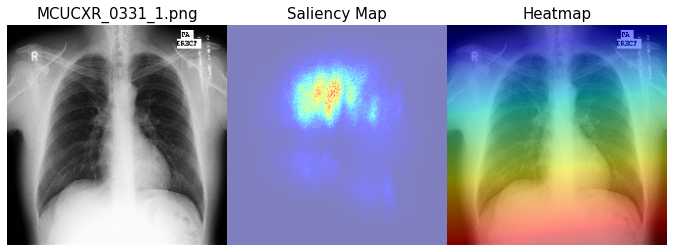

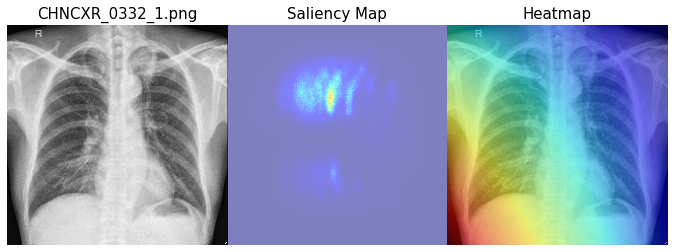

In [48]:
from matplotlib import cm
validDir =  '/content/drive/MyDrive/TB Dataset/valid'
model = tf.keras.models.load_model('/content/saved Models/Classification/Simple CNN/cnn-tb-best-model.h5')

def model_modifier(m):
    m.layers[-1].activation = tf.keras.activations.linear

# Create Saliency object
saliency = Saliency(model, model_modifier)
# Create Gradcam object
gradcam = Gradcam(model, model_modifier)

def Get_Gadcam_Map(img, loss):
  # Define loss function. cls is the output index corresponding to respective class.
  # Generate heatmap with GradCAM
  cam = gradcam(loss, img)
  cam = normalize(cam)
  heatmap = np.uint8(cm.jet(cam)[..., :3] * 255)
  heatmap = np.squeeze(heatmap)
  return heatmap

def Get_Saliency_Map(img, predictions):
  # Define loss function. cls is the output index corresponding to respective class.
  loss = lambda output: K.mean(output[:, predictions])
  # Generate saliency map
  saliency_map = saliency(loss, img, smooth_samples=20)
  saliency_map = normalize(saliency_map)
  saliency_map = np.swapaxes(saliency_map, 0, 2)
  return loss, saliency_map

imgNames = os.listdir(os.path.join(validDir, '1'))
for imgName in imgNames:
  img = tf.keras.preprocessing.image.img_to_array(tf.keras.preprocessing.image.load_img(os.path.join(validDir, '1', imgName), target_size=(224, 224)),
                                            dtype=np.float32)
  img = (img/255.0)
  img = np.expand_dims(img, axis=0)
  predictions = model.predict(img)
  if np.argmax(predictions)==1:
    loss, saliency_map_ = Get_Saliency_Map(img, 1)
    cam_ = Get_Gadcam_Map(img, loss)

    rows = 1
    cols = 3
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(9.5, 10.5), squeeze=False)
    for r in range(rows):
      # plot image
      ax[r][0].imshow(img[0, :, :, :])
      ax[r][0].set_title(imgName, fontsize=15)
      ax[r][0].axis('off')
      
      # plot saliency
      ax[r][1].imshow(saliency_map_[:, :, 0], cmap='jet', alpha=0.5)
      ax[r][1].set_title('Saliency Map', fontsize=15)
      ax[r][1].axis('off')

      # plot heatmap
      ax[r][2].imshow(img[0, :, :, :])
      ax[r][2].imshow(cam_[:, :, :], cmap='jet', alpha=0.5)
      ax[r][2].set_title('Heatmap', fontsize=15)
      ax[r][2].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    fig.savefig('/content/drive/MyDrive/TB Images/CNN-visualization.png')
    plt.show()
    plt.close()

# MobileNetV2 Model

In [23]:
def MobileNetV2_Model():
  # load the VGG16 network, ensuring the head FC layer sets are left off
  baseModel1 = tf.keras.applications.MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
  # construct the head of the model that will be placed on top of the the base model
  output1 = baseModel1.output
  output1 = tf.keras.layers.GlobalAveragePooling2D()(output1)
  output1 = tf.keras.layers.Dense(1024, activation="relu")(output1)
  output1 = tf.keras.layers.Dropout(0.15)(output1)
  output1 = tf.keras.layers.Dense(512, activation="relu")(output1)
  output1 = tf.keras.layers.Dropout(0.15)(output1)
  output1 = tf.keras.layers.Dense(2, activation="softmax")(output1)
  # place the head FC model on top of the base model (this will become the actual model we will train)
  model1 = tf.keras.Model(inputs=baseModel1.input, outputs=output1)
  # loop over all layers in the base model and freeze them so they will not be updated during the first training process
  for layer in baseModel1.layers:
    layer.trainable = False
  return model1

model1 = MobileNetV2_Model()
# compile our model
print("[INFO] compiling model...")
# initialize the initial learning rate, number of epochs to train for, and batch size
INIT_LR = 0.001
EPOCHS1 = 100
BATCHSIZE = 32 
optimizer1 = tf.keras.optimizers.Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model1.compile(loss="categorical_crossentropy", optimizer=optimizer1, metrics=[tf.keras.metrics.CategoricalAccuracy(), tf.keras.metrics.AUC()])
print(model1.summary())

9420800/9406464 [==============================] - 0s 0us/step
[INFO] compiling model...
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
   

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 malization)                                                                                      
                                                                                                  
 block_6_depthwise_relu (ReLU)  (None, 14, 14, 192)  0           ['block_6_depthwise_BN[0][0]']   
                                                                                                  
 block_6_project (Conv2D)       (None, 14, 14, 64)   12288       ['block_6_depthwise_relu[0][0]'] 
                                                                                                  
 block_6_project_BN (BatchNorma  (None, 14, 14, 64)  256         ['block_6_project[0][0]']        
 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
          

In [24]:
modelPath1 = './saved Models/Classification/Pretrained MobileNetV2'
if not os.path.exists(modelPath1):
  os.makedirs(modelPath1)
  print('Model Directory Created')
else:
  print('Model Directory Already Exists')

reduceLROnPlat1 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_categorical_accuracy', factor=0.8, patience=10, verbose=1, mode='auto',
                                                      min_delta=0.0001, cooldown=5, min_lr=0.0001)
early1 = tf.keras.callbacks.EarlyStopping(monitor="val_categorical_accuracy", mode="auto", patience=10)
model_checkpoint1 = tf.keras.callbacks.ModelCheckpoint(modelPath+'/mobilenetv2-best-model.h5', monitor='val_categorical_accuracy',
                                                      verbose=1, save_best_only=True, mode='auto')

STEP_TRAIN = len(train_x) // BATCHSIZE


modelHistory1 = model1.fit(trainAug.flow(train_x, train_y_oneHot, batch_size=BATCHSIZE), steps_per_epoch=STEP_TRAIN, 
                         validation_data= (test_x, test_y_oneHot), epochs=EPOCHS1, verbose=1, callbacks=[model_checkpoint1, reduceLROnPlat1])

tf.keras.models.save_model(model1, modelPath+'/mobilenetv2-model.h5', overwrite=True, include_optimizer=True, save_format=None,
                           signatures=None, options=None)

Model Directory Created
Epoch 1/100
6/6 [==============================] - ETA: 0s - loss: 1.8901 - categorical_accuracy: 0.4706 - auc: 0.4917
Epoch 1: val_categorical_accuracy improved from -inf to 0.50256, saving model to ./saved Models/Classification/Simple CNN/mobilenetv2-best-model.h5
6/6 [==============================] - 12s 2s/step - loss: 1.8901 - categorical_accuracy: 0.4706 - auc: 0.4917 - val_loss: 1.4538 - val_categorical_accuracy: 0.5026 - val_auc: 0.5974 - lr: 0.0010
Epoch 2/100
6/6 [==============================] - ETA: 0s - loss: 1.1756 - categorical_accuracy: 0.5412 - auc: 0.5671
Epoch 2: val_categorical_accuracy did not improve from 0.50256
6/6 [==============================] - 8s 1s/step - loss: 1.1756 - categorical_accuracy: 0.5412 - auc: 0.5671 - val_loss: 0.8233 - val_categorical_accuracy: 0.4974 - val_auc: 0.6419 - lr: 0.0010
Epoch 3/100
6/6 [==============================] - ETA: 0s - loss: 0.6884 - categorical_accuracy: 0.6353 - auc: 0.6830
Epoch 3: val_cate

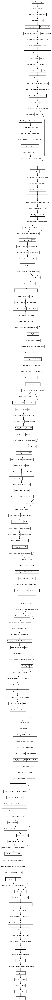

In [30]:
plot_model(model1)

In [25]:
# Evaluate the Best Saved Model
model1 = tf.keras.models.load_model('/content/saved Models/Classification/Simple CNN/mobilenetv2-best-model.h5')
loss1, accuracy1, auc1= model1.evaluate(x=test_x, y=test_y_oneHot, batch_size=32, verbose=1)
print('Model Accuracy: {:0.2f} | Model Loss: {:0.4f} | Model AUC: {:.02f}'.format(accuracy1, loss1, auc1))

7/7 [==============================] - 5s 508ms/step - loss: 0.5314 - categorical_accuracy: 0.8051 - auc: 0.8644
Model Accuracy: 0.81 | Model Loss: 0.5314 | Model AUC: 0.86


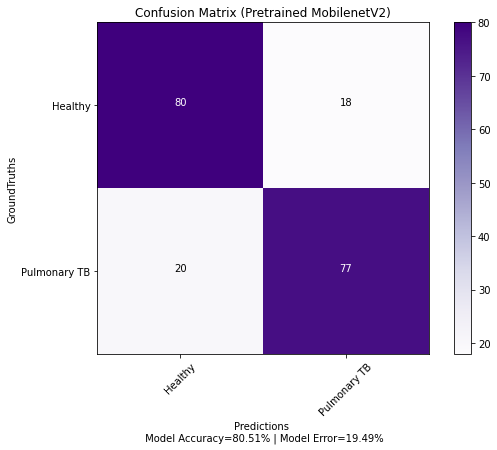

In [26]:
def plot_confusion_matrix(cm, target_names, title='Confusion matrix', cmap=None, normalize=True):

    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Purples')
    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('GroundTruths')
    plt.xlabel('Predictions \n Model Accuracy={:0.2f}% | Model Error={:0.2f}%'.format(accuracy*100, misclass*100))
    plt.savefig('/content/drive/MyDrive/TB Images/MobilenetV2-cm.png', bbox_inches = "tight")
    plt.show()


predictions1 = model1.predict(x=test_x, batch_size=32)
predictions1 = tf.keras.backend.argmax(predictions1, axis=-1)

test_y = tf.keras.backend.argmax(test_y_oneHot, axis=-1)
cm = confusion_matrix(test_y, predictions1)
classes = ['Healthy', 'Pulmonary TB']
plot_confusion_matrix(cm=cm, normalize = False, target_names = classes, title= "Confusion Matrix (Pretrained MobilenetV2)")

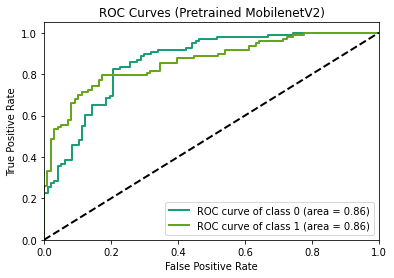

In [27]:
#Plot ROC Curve with Library
predictions1 = model1.predict(x=test_x, batch_size=32)
# One can define colormap here
# cmap = mpl.colors.ListedColormap(['red', 'green', 'blue', 'cyan'])
scikitplot.metrics.plot_roc(y_true=test_y, y_probas=predictions1, title='ROC Curves (Pretrained MobilenetV2)', plot_micro=False, plot_macro=False,
                            classes_to_plot=None, ax=None, figsize=(6, 4), cmap='Dark2', title_fontsize='large', text_fontsize='medium')
plt.savefig('/content/drive/MyDrive/TB Images/MobilenetV2-roc.png', bbox_inches = "tight")
plt.show()

2.8.0


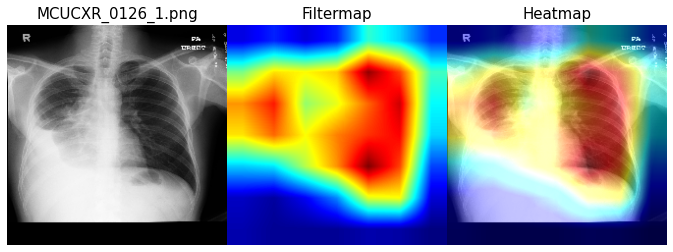

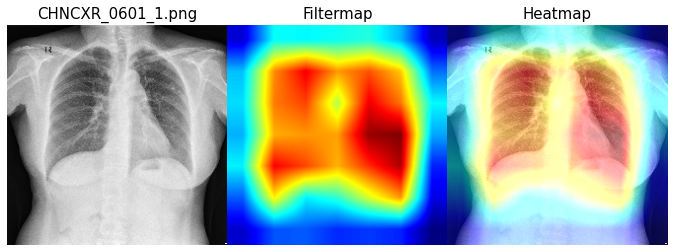

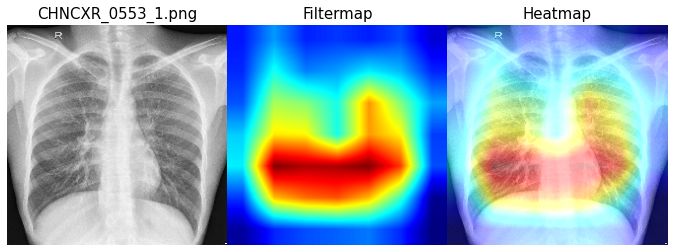

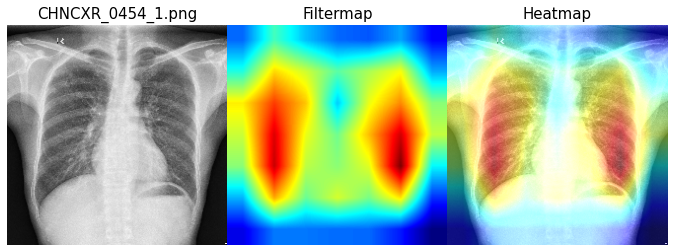

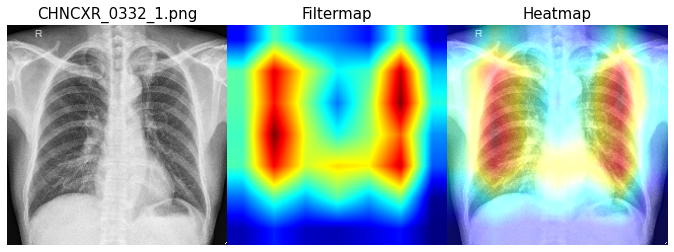

In [47]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

print(tf.__version__)
validDir =  '/content/drive/MyDrive/TB Dataset/valid'
LAYER_NAME = 'out_relu'
model = tf.keras.models.load_model('/content/saved Models/Classification/Simple CNN/mobilenetv2-best-model.h5')
grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(LAYER_NAME).output, model.output])

imgNames = ['MCUCXR_0126_1.png', 'CHNCXR_0601_1.png', 'CHNCXR_0553_1.png', 'CHNCXR_0454_1.png', 'CHNCXR_0332_1.png']
# imgNames = os.listdir(os.path.join(validDir, '1'))
for imgName in imgNames:
  IMAGE_PATH = os.path.join(validDir, '1', imgName)
  img = tf.keras.preprocessing.image.load_img(IMAGE_PATH, target_size=(224, 224))
  img = tf.keras.preprocessing.image.img_to_array(img, dtype='uint8')
  img_array = img/255.0
  predictions = model.predict(np.expand_dims(img_array, axis=0))
  if np.argmax(predictions)==1:
    with tf.GradientTape() as tape:
      conv_outputs, predictions = grad_model(np.array([img_array]))
      loss = predictions[:, np.argmax(predictions)]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]

    gate_f = tf.cast(output > 0, 'float32')
    gate_r = tf.cast(grads > 0, 'float32')
    guided_grads = tf.cast(output > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    weights = tf.reduce_mean(guided_grads, axis=(0, 1))
    cam = np.ones(output.shape[0: 2], dtype = np.float32)

    for i, w in enumerate(weights):
        cam += w * output[:, :, i]

    cam = cv2.resize(cam.numpy(), (224, 224))
    cam = np.maximum(cam, 0)
    heatmap = (cam - cam.min()) / (cam.max() - cam.min())

    cam = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)
    cam = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    output_image = cv2.addWeighted(img, 0.8, cam, 0.5, 0)
    rows = 1
    cols = 3
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(9.5, 10.5), squeeze=False)
    for r in range(rows):
      # plot image
      ax[r][0].imshow(img)
      ax[r][0].set_title(imgName, fontsize=15)
      ax[r][0].axis('off')

      # plot image
      ax[r][1].imshow(cam)
      ax[r][1].set_title('Filtermap', fontsize=15)
      ax[r][1].axis('off')
      
      # plot heatmap
      ax[r][2].imshow(output_image)
      ax[r][2].set_title('Heatmap', fontsize=15)
      ax[r][2].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)
    fig.savefig('/content/drive/MyDrive/TB Images/MobileNetV2-visualization.png')
    plt.show()
    plt.close()

# DenseNet169_Model

In [32]:
def DenseNet169_Model():
  # load the DenseNet169 network, ensuring the head FC layer sets are left off
  baseModel2 = tf.keras.applications.DenseNet169(include_top=False, weights='imagenet', input_shape=(224, 224, 3), pooling=None)
  # construct the head of the model that will be placed on top of the the base model
  output2 = baseModel2.output
  output2 = tf.keras.layers.GlobalAveragePooling2D()(output2)
  output2 = tf.keras.layers.Dense(1024, activation="relu")(output2)
  output2 = tf.keras.layers.Dropout(0.15)(output2)
  output2 = tf.keras.layers.Dense(512, activation="relu")(output2)
  output2 = tf.keras.layers.Dropout(0.15)(output2)
  output2 = tf.keras.layers.Dense(2, activation="softmax")(output2)
  # place the head FC model on top of the base model (this will become the actual model we will train)
  model2 = tf.keras.Model(inputs=baseModel2.input, outputs=output2)
  # loop over all layers in the base model and freeze them so they will not be updated during the first training process
  for layer in baseModel2.layers:
    layer.trainable = False
  return model2

model2 = DenseNet169_Model()
# compile our model
print("[INFO] compiling model...")
# initialize the initial learning rate, number of epochs to train for, and batch size
INIT_LR = 0.001
EPOCHS2 = 100
BATCHSIZE = 32 
optimizer2 = tf.keras.optimizers.Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS2)
model2.compile(loss="categorical_crossentropy", optimizer=optimizer2, metrics=[tf.keras.metrics.CategoricalAccuracy(), tf.keras.metrics.AUC()])
print(model2.summary())

[INFO] compiling model...
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_4[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_2[0][0]']       
                                )                                 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


 te)                                                              'conv2_block6_2_conv[0][0]']    
                                                                                                  
 pool2_bn (BatchNormalization)  (None, 56, 56, 256)  1024        ['conv2_block6_concat[0][0]']    
                                                                                                  
 pool2_relu (Activation)        (None, 56, 56, 256)  0           ['pool2_bn[0][0]']               
                                                                                                  
 pool2_conv (Conv2D)            (None, 56, 56, 128)  32768       ['pool2_relu[0][0]']             
                                                                                                  
 pool2_pool (AveragePooling2D)  (None, 28, 28, 128)  0           ['pool2_conv[0][0]']             
                                                                                                  
 conv3_blo

In [33]:
modelPath2 = './saved Models/Classification/Pretrained DenseNet169'
if not os.path.exists(modelPath2):
  os.makedirs(modelPath2)
  print('Model Directory Created')
else:
  print('Model Directory Already Exists')

reduceLROnPlat2 = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_categorical_accuracy', factor=0.8, patience=10, verbose=1, mode='auto',
                                                      min_delta=0.0001, cooldown=5, min_lr=0.0001)
early2 = tf.keras.callbacks.EarlyStopping(monitor="val_categorical_accuracy", mode="auto", patience=10)
model_checkpoint2 = tf.keras.callbacks.ModelCheckpoint(modelPath+'/denseNet169-best-model.h5', monitor='val_categorical_accuracy',
                                                      verbose=1, save_best_only=True, mode='auto')

STEP_TRAIN = len(train_x) // BATCHSIZE


modelHistory2 = model2.fit(trainAug.flow(train_x, train_y_oneHot, batch_size=BATCHSIZE), steps_per_epoch=STEP_TRAIN, 
                         validation_data= (test_x, test_y_oneHot), epochs=EPOCHS2, verbose=1, callbacks=[model_checkpoint2, reduceLROnPlat2])

tf.keras.models.save_model(model2, modelPath+'/DenseNet169-model.h5', overwrite=True, include_optimizer=True, save_format=None,
                           signatures=None, options=None)

Model Directory Created
Epoch 1/100
6/6 [==============================] - ETA: 0s - loss: 1.7940 - categorical_accuracy: 0.5353 - auc_2: 0.5283
Epoch 1: val_categorical_accuracy improved from -inf to 0.50769, saving model to ./saved Models/Classification/Simple CNN/denseNet169-best-model.h5
6/6 [==============================] - 59s 10s/step - loss: 1.7940 - categorical_accuracy: 0.5353 - auc_2: 0.5283 - val_loss: 0.8228 - val_categorical_accuracy: 0.5077 - val_auc_2: 0.6236 - lr: 0.0010
Epoch 2/100
6/6 [==============================] - ETA: 0s - loss: 0.7585 - categorical_accuracy: 0.5647 - auc_2: 0.5758
Epoch 2: val_categorical_accuracy improved from 0.50769 to 0.58462, saving model to ./saved Models/Classification/Simple CNN/denseNet169-best-model.h5
6/6 [==============================] - 48s 9s/step - loss: 0.7585 - categorical_accuracy: 0.5647 - auc_2: 0.5758 - val_loss: 0.6489 - val_categorical_accuracy: 0.5846 - val_auc_2: 0.6697 - lr: 0.0010
Epoch 3/100
6/6 [=================

In [34]:
# Evaluate the Best Saved Model
model2 = tf.keras.models.load_model('/content/saved Models/Classification/Simple CNN/denseNet169-best-model.h5')
loss2, accuracy2, auc2= model2.evaluate(x=test_x, y=test_y_oneHot, batch_size=32, verbose=1)
print('Model Accuracy: {:0.2f} | Model Loss: {:0.4f} | Model AUC: {:.02f}'.format(accuracy2, loss2, auc2))

7/7 [==============================] - 38s 5s/step - loss: 0.4058 - categorical_accuracy: 0.8410 - auc_2: 0.9027
Model Accuracy: 0.84 | Model Loss: 0.4058 | Model AUC: 0.90


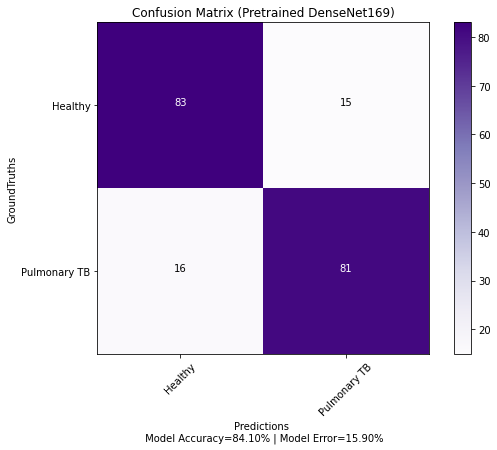

In [35]:
def plot_confusion_matrix(cm, target_names, title='Confusion matrix', cmap=None, normalize=True):
  
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Purples')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('GroundTruths')
    plt.xlabel('Predictions \n Model Accuracy={:0.2f}% | Model Error={:0.2f}%'.format(accuracy*100, misclass*100))
    plt.savefig('/content/drive/MyDrive/TB Images/DenseNet169-cm.png', bbox_inches = "tight")
    plt.show()


predictions2 = model2.predict(x=test_x, batch_size=32)
predictions2 = tf.keras.backend.argmax(predictions2, axis=-1)

test_y = tf.keras.backend.argmax(test_y_oneHot, axis=-1)
cm = confusion_matrix(test_y, predictions2)
classes = ['Healthy', 'Pulmonary TB']
plot_confusion_matrix(cm=cm, normalize = False, target_names = classes, title= "Confusion Matrix (Pretrained DenseNet169)")

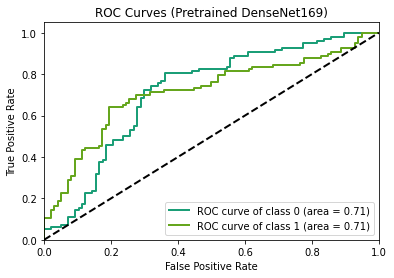

In [36]:
#Plot ROC Curve with Library
predictions2 = model2.predict(x=test_x, batch_size=32)
# One can define colormap here
# cmap = mpl.colors.ListedColormap(['red', 'green', 'blue', 'cyan'])
scikitplot.metrics.plot_roc(y_true=test_y, y_probas=predictions, title='ROC Curves (Pretrained DenseNet169)', plot_micro=False, plot_macro=False,
                            classes_to_plot=None, ax=None, figsize=(6, 4), cmap='Dark2', title_fontsize='large', text_fontsize='medium')
plt.savefig('/content/drive/MyDrive/TB Images/DenseNet169-roc.png', bbox_inches = "tight")
plt.show()

2.8.0
(6, 224, 224, 3)


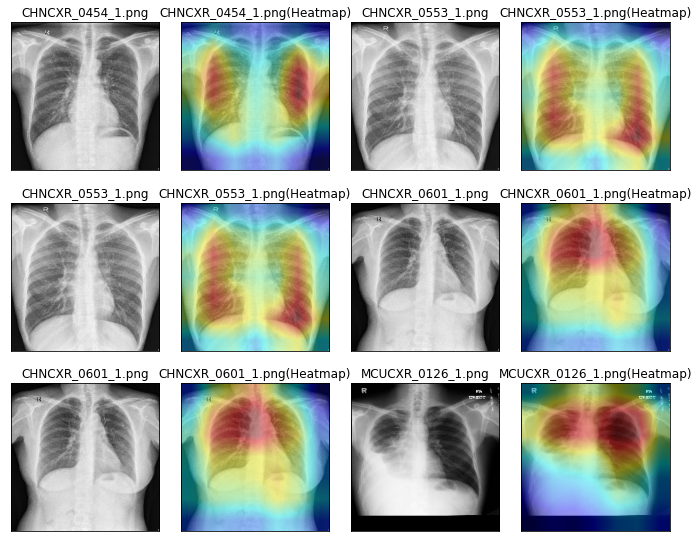

In [46]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

print(tf.__version__)
validDir =  '/content/drive/MyDrive/TB Dataset/valid'
LAYER_NAME = 'relu'
model = tf.keras.models.load_model('/content/saved Models/Classification/Simple CNN/denseNet169-best-model.h5')
grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(LAYER_NAME).output, model.output])


def GetHeatMap(img):
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.array([img]))
        loss = predictions[:, np.argmax(predictions)]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]

    gate_f = tf.cast(output > 0, 'float32')
    gate_r = tf.cast(grads > 0, 'float32')
    guided_grads = tf.cast(output > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    weights = tf.reduce_mean(guided_grads, axis=(0, 1))

    cam = np.ones(output.shape[0: 2], dtype = np.float32)

    for i, w in enumerate(weights):
        cam += w * output[:, :, i]

    cam = cv2.resize(cam.numpy(), (224, 224))
    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() - cam.min())

    cam = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    cam = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)

    heatmap = cv2.addWeighted(np.uint8(255*img), 0.6, cam, 0.4, 0)
    return heatmap

imgSize = 224
channels = 3
imgNames = ['CHNCXR_0332_1.png', 'CHNCXR_0454_1.png', 'CHNCXR_0553_1.png', 'CHNCXR_0601_1.png', 'MCUCXR_0126_1.png', 'CHNCXR_0657_1.png']
images = []
for imgName in imgNames:
    imgPath = os.path.join(validDir, '1', imgName)
    img = tf.keras.preprocessing.image.img_to_array(tf.keras.preprocessing.image.load_img(imgPath, target_size=(imgSize, imgSize)), dtype='float32')/255.0
    images.append(img)

images = np.array(images).reshape(-1, imgSize, imgSize, channels)
print(images.shape)

rows = 3
cols = 4
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(10, 8), subplot_kw={'xticks': [], 'yticks': []})
img_count =1
for r in range(rows):
    # plot image
    ax[r][0].imshow(images[img_count, :, :, :])
    ax[r][0].set_title(imgNames[img_count], fontsize=12)

    # plot heatmap
    ax[r][1].imshow(images[img_count, :, :, :])
    ax[r][1].imshow(GetHeatMap(images[img_count, :, :, :]))
    ax[r][1].set_title(imgNames[img_count]+ '(Heatmap)', fontsize=12)

    img_count+=1
    # plot pneumonia image
    ax[r][2].imshow(images[img_count, :, :, :])
    ax[r][2].set_title(imgNames[img_count], fontsize=12)

    # plot heatmap
    ax[r][3].imshow(images[img_count, :, :, :])
    ax[r][3].imshow(GetHeatMap(images[img_count, :, :, :]))
    ax[r][3].set_title(imgNames[img_count]+ '(Heatmap)', fontsize=12)

plt.tight_layout()
plt.subplots_adjust(wspace=0.15, hspace=0)
fig.savefig('/content/drive/MyDrive/TB Images/denseNet169-visualization.png')
plt.show()
plt.close()